# Introduction to Model Interpretability

Note: This notebook uses features introduced in Python 3.6 and sklearn 0.20.


First we'll need a few imports:

In [1]:
# Obviously
import pandas as pd

# Some sklearn tools for preprocessing and building a pipeline. 
# ColumnTransformer was introduced in 0.20 so make sure you have this version
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Our algorithms, by from the easiest to the hardest to intepret.
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost.sklearn import XGBClassifier

### The Dataset

The dataset can be downloaded [here](https://archive.ics.uci.edu/ml/datasets/bank+marketing). It consists of data from marketing campaigns of a Portuguese bank. We will try to build classifiers that can predict whether or not the client targeted by the campaign ended up subscribing to a term deposit (column `y`).

In [2]:
df = pd.read_csv("data/bank-additional-full.csv", sep=";")

In [3]:
df['y'].value_counts()

y
no     36548
yes     4640
Name: count, dtype: int64

The dataset is imbalanced, we will need to keep that in mind when building our models!

In [4]:
# Get X, y
y = df["y"].map({"no":0, "yes":1})
X = df.drop("y", axis=1)

Let's look at the features in the X matrix:

1. age (numeric)
2. job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3. marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4. education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5. default: has credit in default? (categorical: 'no','yes','unknown')
6. housing: has housing loan? (categorical: 'no','yes','unknown')
7. loan: has personal loan? (categorical: 'no','yes','unknown')
8. contact: contact communication type (categorical: 'cellular','telephone') 
9. month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10. day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11. duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
12. campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13. pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14. previous: number of contacts performed before this campaign and for this client (numeric)
15. poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
16. emp.var.rate: employment variation rate - quarterly indicator (numeric)
17. cons.price.idx: consumer price index - monthly indicator (numeric) 
18. cons.conf.idx: consumer confidence index - monthly indicator (numeric) 
19. euribor3m: euribor 3 month rate - daily indicator (numeric)
20. nr.employed: number of employees - quarterly indicator (numeric)

Note the comment about `duration` feature. We will exclude it from our analysis.

In [5]:
X.drop("duration", inplace=True, axis=1)

In [6]:
X.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
dtype: object

In [7]:
# Some such as default would be binary features, but since
# they have a third class "unknown" we'll process them as non binary categorical
num_features = ["age", "campaign", "pdays", "previous", "emp.var.rate", 
                "cons.price.idx", "cons.conf.idx","euribor3m", "nr.employed"]

cat_features = ["job", "marital", "education","default", "housing", "loan",
                "contact", "month", "day_of_week", "poutcome"]

We'll define a new `ColumnTransformer` object (new in sklearn 0.20) that keeps our numerical features and apply one hot encoding on our categorical features. That will allow us to create a clean pipeline that includes both features engineering (one hot encoding here) and training the model (a nice way to avoid data leakage)

https://scikit-learn.org/stable/modules/generated/sklearn.compose.ColumnTransformer.html

This estimator allows different columns or column subsets of the input to be transformed separately and the features generated by each transformer will be concatenated to form a single feature space. This is useful for heterogeneous or columnar data, to combine several feature extraction mechanisms or transformations into a single transformer.

Example: https://scikit-learn.org/stable/auto_examples/compose/plot_column_transformer_mixed_types.html#sphx-glr-auto-examples-compose-plot-column-transformer-mixed-types-py

In [8]:
preprocessor = ColumnTransformer([("numerical", "passthrough", num_features), 
                                  #passing numerical features no need for analysis right now
                                  ("categorical", OneHotEncoder(sparse=False, handle_unknown="ignore"),
                                   cat_features)])

Now we can define our 4 models as sklearn `Pipeline` object, containing our preprocessing step and training of one given algorithm.

In [9]:
# Logistic Regression
lr_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", LogisticRegression(class_weight="balanced", solver="liblinear", random_state=42))])

# Decision Tree
dt_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", DecisionTreeClassifier(class_weight="balanced"))])

# Random Forest
rf_model = Pipeline([("preprocessor", preprocessor), 
                     ("model", RandomForestClassifier(class_weight="balanced", n_estimators=100, n_jobs=-1))])

# XGBoost
xgb_model = Pipeline([("preprocessor", preprocessor), 
                      # Add a scale_pos_weight to make it balanced
                      ("model", XGBClassifier(scale_pos_weight=(1 - y.mean()), n_jobs=-1))])

Let's split the data into training and test sets.

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=.3, random_state=42)

We're good to go!

## Eli5 to intepret "white box" models

### With Logistic Regression

First let's fine tune our logistic regression and evaluate its performance.

In [11]:
gs = GridSearchCV(lr_model, {"model__C": [1, 1.3, 1.5]}, n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_out

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['age',
                                                                          'campaign',
                                                                          'pdays',
                                                                          'previous',
                                                                          'emp.var.rate',
                                                                          'cons.price.idx',
                                                                          'cons.conf.idx',
                                                                          'euribor3m',
                                                                          'nr.employed']),
                                                                        ('categorical',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         ['job',
                                                                          'marital',
                                                                          'education',
                                                                          'default',
                                                                          'housing',
                                                                          'loan',
                                                                          'contact',
                                                                          'month',
                                                                          'day_of_week',
                                                                          'poutcome'])])),
                                       ('model',
                                        LogisticRegression(class_weight='balanced',
                                                           random_state=42,
                                                           solver='liblinear'))]),
             n_jobs=-1, param_grid={'model__C': [1, 1.3, 1.5]},
             scoring='accuracy')

Let's see our best parameters and score

In [12]:
print(gs.best_params_)
print(gs.best_score_)

{'model__C': 1}
0.8276160466866243


In [13]:
lr_model.set_params(**gs.best_params_)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'month', 'day_of_week',
                                                   'poutcome'])])),
                ('model',
                 LogisticRegression(C=1, class_weight='balanced',
                                    random_state=42, solver='liblinear'))])

In [14]:
lr_model.get_params("model")

{'memory': None,
 'steps': [('preprocessor',
   ColumnTransformer(transformers=[('numerical', 'passthrough',
                                    ['age', 'campaign', 'pdays', 'previous',
                                     'emp.var.rate', 'cons.price.idx',
                                     'cons.conf.idx', 'euribor3m',
                                     'nr.employed']),
                                   ('categorical',
                                    OneHotEncoder(handle_unknown='ignore',
                                                  sparse=False),
                                    ['job', 'marital', 'education', 'default',
                                     'housing', 'loan', 'contact', 'month',
                                     'day_of_week', 'poutcome'])])),
  ('model',
   LogisticRegression(C=1, class_weight='balanced', random_state=42,
                      solver='liblinear'))],
 'verbose': False,
 'preprocessor': ColumnTransformer(transformers=[('numerical',

Now we can fit the model on the whole training set and calculate accuracy on the test set.

In [15]:
lr_model.fit(X_train, y_train)

/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'month', 'day_of_week',
                                                   'poutcome'])])),
                ('model',
                 LogisticRegression(C=1, class_weight='balanced',
                                    random_state=42, solver='liblinear'))])

Generate predictions

In [16]:
y_pred = lr_model.predict(X_test)

In [17]:
accuracy_score(y_test, y_pred)

0.8322408351541636

In [18]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.86      0.90     10965
           1       0.36      0.64      0.46      1392

    accuracy                           0.83     12357
   macro avg       0.66      0.75      0.68     12357
weighted avg       0.88      0.83      0.85     12357



Let's use `eli5` to visualise the weights associated to each feature:

In [19]:
import eli5
eli5.show_weights(lr_model.named_steps["model"])

2024-06-21 16:02:09.505301: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-21 16:02:09.505690: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-21 16:02:09.507884: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-21 16:02:09.529876: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-21 16:02:10.170456: W tensorflow/compiler/tf2tensorrt/utils/py_uti

Weight?,Feature
+1.031,x49
+0.708,x7
+0.607,x5
+0.585,x29
+0.388,x24
+0.367,x14
+0.301,x46
+0.281,x45
+0.240,x42
+0.201,x61


That gives us the weights associated to each feature, that can be seen as the contribution of each feature into predicting that the class will be y=1 (the client will subscribe after the campaign).

The names for each features aren't really helping though, we can pass a list of column names to `eli5` but we'll need to do a little gymnastics first to extract names from our preprocessor in the pipeline (since we've generated new features on the fly with the one hot encoder)

In [20]:
preprocessor = lr_model.named_steps["preprocessor"]

In [21]:
ohe_categories = preprocessor.named_transformers_["categorical"].categories_

In [22]:
new_ohe_features = [f"{col}__{val}" for col, vals in zip(cat_features, ohe_categories) for val in vals]

In [23]:
all_features = num_features + new_ohe_features

Great, so now we have a nice list of columns after processing. Let's visualise the data in a dataframe just for sanity check:

In [24]:
pd.DataFrame(lr_model.named_steps["preprocessor"].transform(X_train), columns=all_features).head()

,age,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,job__admin.,...,month__oct,month__sep,day_of_week__fri,day_of_week__mon,day_of_week__thu,day_of_week__tue,day_of_week__wed,poutcome__failure,poutcome__nonexistent,poutcome__success
0,50.0,2.0,999.0,0.0,1.1,93.994,-36.4,4.860,5191.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,51.0,5.0,999.0,0.0,1.1,93.994,-36.4,4.858,5191.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,46.0,2.0,999.0,0.0,-1.8,92.893,-46.2,1.244,5099.1,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,46.0,1.0,999.0,0.0,1.4,94.465,-41.8,4.961,5228.1,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,25.0,5.0,999.0,0.0,-1.8,92.893,-46.2,1.266,5099.1,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


Looks good!

In [25]:
eli5.show_weights(lr_model.named_steps["model"], feature_names=all_features)

Weight?,Feature
+1.031,month__mar
+0.708,euribor3m
+0.607,cons.price.idx
+0.585,education__illiterate
+0.388,marital__unknown
+0.367,job__retired
+0.301,month__dec
+0.281,month__aug
+0.240,contact__cellular
+0.201,poutcome__success


Looks like it's picking principally on whether the month is march or not, the marketting campaign seem to have been more efficient in march?

We can also use `eli5` to explain a specific prediction, let's pick a row in the test data:

In [26]:
i = 4
X_test.iloc[[i]]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
39993,27,unknown,single,university.degree,no,yes,no,cellular,jun,wed,4,3,2,success,-1.7,94.055,-39.8,0.767,4991.6


In [27]:
y_test.iloc[i]

1

Our client subsribed to the term deposit after the campaign! Let's see what our model would have predicted and how it would explain it.

We'll need to first transform our row into the format expected by our model as `eli5` cannot work directly with our pipeline.

Note: `eli5` actually does support pipeline, but with a limited number of transformations only. In our pipeline it does not support the `passthrough` transformation (which, funny enough, doesn't do anything...)

In [28]:
eli5.show_prediction(lr_model.named_steps["model"], 
                     lr_model.named_steps["preprocessor"].transform(X_test)[i],
                     feature_names=all_features, show_feature_values=True)

### with a Decision Tree

`eli5` can also be used to intepret decision trees:

In [29]:
gs = GridSearchCV(dt_model, {"model__max_depth": [3, 5, 7], 
                             "model__min_samples_split": [2, 5]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_out

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['age',
                                                                          'campaign',
                                                                          'pdays',
                                                                          'previous',
                                                                          'emp.var.rate',
                                                                          'cons.price.idx',
                                                                          'cons.conf.idx',
                                                                          'euribor3m',
                                                                          'nr.employed']),
                                                                        ('categorical',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         ['job',
                                                                          'marital',
                                                                          'education',
                                                                          'default',
                                                                          'housing',
                                                                          'loan',
                                                                          'contact',
                                                                          'month',
                                                                          'day_of_week',
                                                                          'poutcome'])])),
                                       ('model',
                                        DecisionTreeClassifier(class_weight='balanced'))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [3, 5, 7],
                         'model__min_samples_split': [2, 5]},
             scoring='accuracy')

Let's see our best parameters and score

In [30]:
print(gs.best_params_)
print(gs.best_score_)

{'model__max_depth': 5, 'model__min_samples_split': 2}
0.8510276243107213


In [31]:
dt_model.set_params(**gs.best_params_)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'month', 'day_of_week',
                                                   'poutcome'])])),
                ('model',
                 DecisionTreeClassifier(class_weight='balanced', max_depth=5))])

In [32]:
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict(X_test)

/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [33]:
accuracy_score(y_test, y_pred)

0.8553046856033018

In [34]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.89      0.92     10965
           1       0.41      0.62      0.49      1392

    accuracy                           0.86     12357
   macro avg       0.68      0.75      0.70     12357
weighted avg       0.89      0.86      0.87     12357



For Decision Trees, `eli5` only gives feature importance, which does not say in what direction a feature impact the predicted outcome.

In [35]:
eli5.show_weights(dt_model.named_steps["model"], feature_names=all_features)

Weight,Feature
0.7088,nr.employed
0.1340,cons.conf.idx
0.0444,cons.price.idx
0.0338,pdays
0.0238,euribor3m
0.0211,month__oct
0.0125,default__unknown
0.0081,poutcome__failure
0.0045,contact__telephone
0.0039,campaign


Here the most important feature seems to be `nr.employed`. We can also get an explanation for a given prediction, this will calculate the contribution of each feature in the prediction:

In [36]:
eli5.show_prediction(dt_model.named_steps["model"], 
                     dt_model.named_steps["preprocessor"].transform(X_test)[i],
                     feature_names=all_features, show_feature_values=True)

Here the explanation for a single prediction is calculated by following the decision path in the tree, and adding up contribution of each feature from each node crossed into the overall probability predicted.

`eli5` can also be used to explain black box models, but we will use `Lime` and `SHAP` for our two last models instead.

## LIME to generate local intepretations of black box models

LIME stands for `Local Interpretable Model-Agnostic Explanations`. We can use it with any model we've built in order to explain why it took a specific decision for a given observation. To do so, LIME creates a dataset in the locality of our observation by perturbating the different features. Then it fits a local linear model on this data and uses the weights on each feature to provide an explanation.

### with a Random Forest

In [37]:
gs = GridSearchCV(rf_model, {"model__max_depth": [10, 15], 
                             "model__min_samples_split": [5, 10]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_out

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['age',
                                                                          'campaign',
                                                                          'pdays',
                                                                          'previous',
                                                                          'emp.var.rate',
                                                                          'cons.price.idx',
                                                                          'cons.conf.idx',
                                                                          'euribor3m',
                                                                          'nr.employed']),
                                                                        ('categorical',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         ['job',
                                                                          'marital',
                                                                          'education',
                                                                          'default',
                                                                          'housing',
                                                                          'loan',
                                                                          'contact',
                                                                          'month',
                                                                          'day_of_week',
                                                                          'poutcome'])])),
                                       ('model',
                                        RandomForestClassifier(class_weight='balanced',
                                                               n_jobs=-1))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [10, 15],
                         'model__min_samples_split': [5, 10]},
             scoring='accuracy')

Let's see our best parameters and score

In [38]:
print(gs.best_params_)
print(gs.best_score_)

{'model__max_depth': 15, 'model__min_samples_split': 5}
0.8758973950908147


In [39]:
rf_model.set_params(**gs.best_params_)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'month', 'day_of_week',
                                                   'poutcome'])])),
                ('model',
                 RandomForestClassifier(class_weight='balanced', max_depth=15,
                                        min_samples_split=5, n_jobs=-1))])

In [40]:
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [41]:
accuracy_score(y_test, y_pred)

0.8807963097839281

In [42]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93     10965
           1       0.48      0.58      0.52      1392

    accuracy                           0.88     12357
   macro avg       0.71      0.75      0.73     12357
weighted avg       0.89      0.88      0.89     12357



We can look at the features importance with Eli5 first:

In [43]:
eli5.show_weights(rf_model.named_steps["model"], 
                  feature_names=all_features)

Weight,Feature
0.1479 ± 0.2247,euribor3m
0.1051 ± 0.2613,nr.employed
0.0802 ± 0.2209,emp.var.rate
0.0715 ± 0.0342,age
0.0543 ± 0.1265,cons.conf.idx
0.0465 ± 0.1348,pdays
0.0412 ± 0.0878,cons.price.idx
0.0403 ± 0.0159,campaign
0.0296 ± 0.1089,poutcome__success
0.0186 ± 0.0544,contact__cellular


We can explain roughly what our model seems to focus on mostly. We also get the standard deviation of feature importance accross the multiple trees in our ensemble.

### Let's train our XGB model as well

In [44]:
gs = GridSearchCV(xgb_model, {"model__max_depth": [5, 10],
                              "model__min_child_weight": [5, 10],
                              "model__n_estimators": [25]},
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_out

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         'passthrough',
                                                                         ['age',
                                                                          'campaign',
                                                                          'pdays',
                                                                          'previous',
                                                                          'emp.var.rate',
                                                                          'cons.price.idx',
                                                                          'cons.conf.idx',
                                                                          'euribor3m',
                                                                          'nr.employed']),
                                                                        ('categorical',
                                                                         OneHotEncoder(handle_unknown='ignore',
                                                                                       sparse=False),
                                                                         ['job',
                                                                          'marital',
                                                                          'education',
                                                                          'default',
                                                                          'housing',
                                                                          'l...
                                                      max_cat_to_onehot=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      multi_strategy=None,
                                                      n_estimators=None,
                                                      n_jobs=-1,
                                                      num_parallel_tree=None,
                                                      random_state=None, ...))]),
             n_jobs=-1,
             param_grid={'model__max_depth': [5, 10],
                         'model__min_child_weight': [5, 10],
                         'model__n_estimators': [25]},
             scoring='accuracy')

Let's see our best parameters and score.

In [45]:
print(gs.best_params_)
print(gs.best_score_)
xgb_model.set_params(**gs.best_params_)
xgb_model.fit(X_train, y_train)

/home/alexander/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


{'model__max_depth': 5, 'model__min_child_weight': 5, 'model__n_estimators': 25}
0.9002461587725588


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', 'passthrough',
                                                  ['age', 'campaign', 'pdays',
                                                   'previous', 'emp.var.rate',
                                                   'cons.price.idx',
                                                   'cons.conf.idx', 'euribor3m',
                                                   'nr.employed']),
                                                 ('categorical',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['job', 'marital',
                                                   'education', 'default',
                                                   'housing', 'loan', 'contact',
                                                   'month', 'day_...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=5, max_leaves=None, min_child_weight=5,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=25, n_jobs=-1,
                               num_parallel_tree=None, random_state=None, ...))])

Generate predictions

In [46]:
y_pred = xgb_model.predict(X_test)

In [47]:
accuracy_score(y_test, y_pred)

0.9015133122926277

In [48]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.99      0.95     10965
           1       0.69      0.23      0.34      1392

    accuracy                           0.90     12357
   macro avg       0.80      0.61      0.65     12357
weighted avg       0.88      0.90      0.88     12357



### Create an explainer

In order to explain why the model classifies invidividual observations as class 0 or 1, we are going to use the `LimeTabularExplainer` from the library `lime`, this is the main explainer to use for tabular data. Lime also provides an explainer for text data, for images and for time-series.

When using the tabular explainer, we need to provide our training set as parameter so that `lime` can compute statistics on each feature, either `mean` and `std` for numerical features, or frequency of values for categorical features. Those statistics are used to scale the data and generate new perturbated data to train our local linear models on.

In [49]:
from lime.lime_tabular import LimeTabularExplainer

The parameters passed to the explainer are:
- our training set, we need to make sure we use the training set *without* one hot encoding
- `mode`: the explainer can be used for classification or regression
- `feature_names`: list of labels for our features
- `categorical_features`: list of indexes of categorical features
- `categorical_names`: dict mapping each index of categorical feature to a list of corresponding labels
- `dicretize_continuous`: will discretize numerical values into buckets that can be used for explanation. For instance it can tell us that the decision was made because distance is in bucket [5km, 10km] instead of telling us distance is an importante feature.

First, in order to get the `categorical_names` parameter we need to build a dictionary with indexes of categorical values in original dataset as keys and lists of possible categories as values:

In [50]:
categorical_names = {}
for col in cat_features:
    categorical_names[X_train.columns.get_loc(col)] = [new_col.split("__")[1] 
                                                       for new_col in new_ohe_features 
                                                       if new_col.split("__")[0] == col]

In [51]:
categorical_names

{1: ['admin.',
  'blue-collar',
  'entrepreneur',
  'housemaid',
  'management',
  'retired',
  'self-employed',
  'services',
  'student',
  'technician',
  'unemployed',
  'unknown'],
 2: ['divorced', 'married', 'single', 'unknown'],
 3: ['basic.4y',
  'basic.6y',
  'basic.9y',
  'high.school',
  'illiterate',
  'professional.course',
  'university.degree',
  'unknown'],
 4: ['no', 'unknown', 'yes'],
 5: ['no', 'unknown', 'yes'],
 6: ['no', 'unknown', 'yes'],
 7: ['cellular', 'telephone'],
 8: ['apr', 'aug', 'dec', 'jul', 'jun', 'mar', 'may', 'nov', 'oct', 'sep'],
 9: ['fri', 'mon', 'thu', 'tue', 'wed'],
 13: ['failure', 'nonexistent', 'success']}

`Lime` needs the dataset that is passed to have categorical values converted to integer labels that maps to the values in `categorical_names`. For instance, label `0` for the column `2` will map to `divorced`. We will use a custom helper function to do so, that converts data from original to LIME and from LIME to original format.

That function is going over all categorical features and replacing strings by the correct integer labels, feel free to check `helpers.py`.

In [52]:
from helpers import convert_to_lime_format

Let's check that it worked:

In [53]:
convert_to_lime_format(X_train, categorical_names).head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
7309,50,1,2,0,0,0,0,1,6,2,2,999,0,1,1.1,93.994,-36.4,4.860,5191.0
4169,51,7,1,5,1,0,0,1,6,1,5,999,0,1,1.1,93.994,-36.4,4.858,5191.0
35810,46,9,0,5,0,2,0,0,6,1,2,999,0,1,-1.8,92.893,-46.2,1.244,5099.1
9668,46,0,2,6,0,2,0,1,4,1,1,999,0,1,1.4,94.465,-41.8,4.961,5228.1
34389,25,7,2,3,0,0,0,0,6,2,5,999,0,1,-1.8,92.893,-46.2,1.266,5099.1


In [54]:
explainer = LimeTabularExplainer(convert_to_lime_format(X_train, categorical_names).values,
                                 mode="classification",
                                 feature_names=X_train.columns.tolist(),
                                 categorical_names=categorical_names,
                                 categorical_features=categorical_names.keys(),
                                 discretize_continuous=True,
                                 random_state=42)

Great, our explainer is ready. Now let's pick an observation we want to explain.

#### Explain new observations

We'll create a variable called `observation` that contains our ith observation in the test dataset.

In [55]:
i = 2
X_observation = X_test.iloc[[i], :]
X_observation

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
12077,35,technician,single,professional.course,no,no,no,telephone,jun,fri,1,999,0,nonexistent,1.4,94.465,-41.8,4.947,5228.1


In [56]:
print(f"""\
* True label: {y_test.iloc[i]}
* LR: {lr_model.predict_proba(X_observation)[0]}
* DT: {dt_model.predict_proba(X_observation)[0]}
* RF: {rf_model.predict_proba(X_observation)[0]}
* XGB: {xgb_model.predict_proba(X_observation)[0]}""")

* True label: 0
* LR: [0.71173104 0.28826896]
* DT: [0.75848014 0.24151986]
* RF: [0.81163181 0.18836819]
* XGB: [0.9572216  0.04277838]


Let's convert our observation to lime format and convert it to a numpy array.

In [57]:
observation = convert_to_lime_format(X_test.iloc[[i], :],categorical_names).values[0]
observation

array([35, 9, 2, 5, 0, 0, 0, 1, 4, 0, 1, 999, 0, 1, 1.4, 94.465, -41.8,
       4.947, 5228.1], dtype=object)

In order to explain a prediction, we use the `explain_instance` method on our explainer. This will generate new data with perturbated features around the observation and learn a local linear model. It needs to take:
- our observation as a numpy array
- a function that uses our model to predict probabilities given the data (in same format we've passed in our explainer). That means we cannot pass directly our `rf_model.predict_proba` because our pipeline expects string labels for categorical values. We will need to create a custom function `rf_predict_proba` that first converts back integer labels to strings and then calls `rf_model.predict_proba`.
- `num_features`: number of features to consider in explanation

In [58]:
# Let write a custom predict_proba functions for our models:
from functools import partial

def custom_predict_proba(X, model):
    X_str = convert_to_lime_format(X, categorical_names, col_names=X_train.columns, invert=True)
    return model.predict_proba(X_str)

lr_predict_proba = partial(custom_predict_proba, model=lr_model)
dt_predict_proba = partial(custom_predict_proba, model=dt_model)
rf_predict_proba = partial(custom_predict_proba, model=rf_model)
xgb_predict_proba = partial(custom_predict_proba, model=xgb_model)

Let's test our custom function to make sure it generates propabilities properly

In [59]:
explanation = explainer.explain_instance(observation, lr_predict_proba, num_features=5)

Now that we have generated our explanation, we have access to several representations. The most useful one when working in a notebook is `show_in_notebook`.


On the left it shows the list of probabilities for each class, here the model classified our observation as 0 (non subsribed) with a high probability.
* If you set `show_table=True`, you will see the table with the most important features for this observation on the right.

In [60]:
explanation.show_in_notebook(show_table=True, show_all=False)

You can also save the explanation to an html file with `save_to_file` to share it.

In [61]:
explanation.save_to_file("explanation.html")

LIME is fitting a linear model on a local perturbated dataset. You can access the coefficients, the intercept and the R squared of the linear model by calling respectively `.local_exp`, `.intercept` and `.score` on your explanation.

In [62]:
print(explanation.local_exp)
print(explanation.intercept)
print(explanation.score)

{1: [(14, -0.33705103422010146), (17, 0.1945632253360787), (18, -0.18054045078463543), (15, 0.0988070020146771), (7, -0.06929460769811042)]}
{1: 0.6711063816563096}
0.41280874791113553


If your R-squared is low, the linear model that LIME fitted isn't a great approximation to your model, which means you should not rely too much on the explanation it provides.

In [63]:
explanation = explainer.explain_instance(observation, dt_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.150448667782488


In [64]:
explanation = explainer.explain_instance(observation, rf_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.38417695650383465


In [65]:
explanation = explainer.explain_instance(observation, xgb_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.31849793426519757


## More local interpretation with SHAP

In [66]:
import shap
# Need to load JS vis in the notebook
shap.initjs() 

SHAP has a generic explainer that works for any model and a TreeExplainer optimised for tree based models. Here we will focus on the `TreeExplainer` with our XGB model (the hardest to intepret)

In [67]:
explainer = shap.TreeExplainer(xgb_model.named_steps["model"])

In order to compute the shapley values with the tree explainer, we need to call the `shap_values` methods passing a dataset. That can be quite computationally expensive, so we will only pass 1000 samples picked at random.

In [68]:
observations = xgb_model.named_steps["preprocessor"].transform(X_train.sample(1000, random_state=42))
shap_values = explainer.shap_values(observations)

Now we can start visualising our explanations using the `force_plot` function from the shap package passing our first shap_value (we also need to pass `explainer.expected_value` which is the base value).

In [69]:
i = 0
shap.force_plot(explainer.expected_value, shap_values[i], 
                features=observations[i], feature_names=all_features)

This explanation shows how each feature contributes to shifting the prediction from the base value to the output value of the model either by decreasing or increasing the probability of our class.

We can also visualise all points in our dataset at once with a given class by passing all explanations for that class to `force_plot`

In [70]:
shap.force_plot(explainer.expected_value, shap_values,
                features=observations, feature_names=all_features)

We can see our 1000 samples on the x axis. The y-axis corresponds to the same scale we were looking at before, where blue values corresponds to the probability decreasing, red increasing. Hover with your mouse on a point to see the main features impacting a given observation. You can also use the drop down on the left to visualise the impact of specific features, for example duration only.

Another interesting plot that we can generate with SHAP is the `summary_plot`, it can be seen as a feature importance plot with more meaningful insights. Below we're plotting the summary plot for class 1 on the whole subset.
The colour corresponds to the value of the feature and the x axis corresponds to the SHAP value, meaning the impact on the probability. 

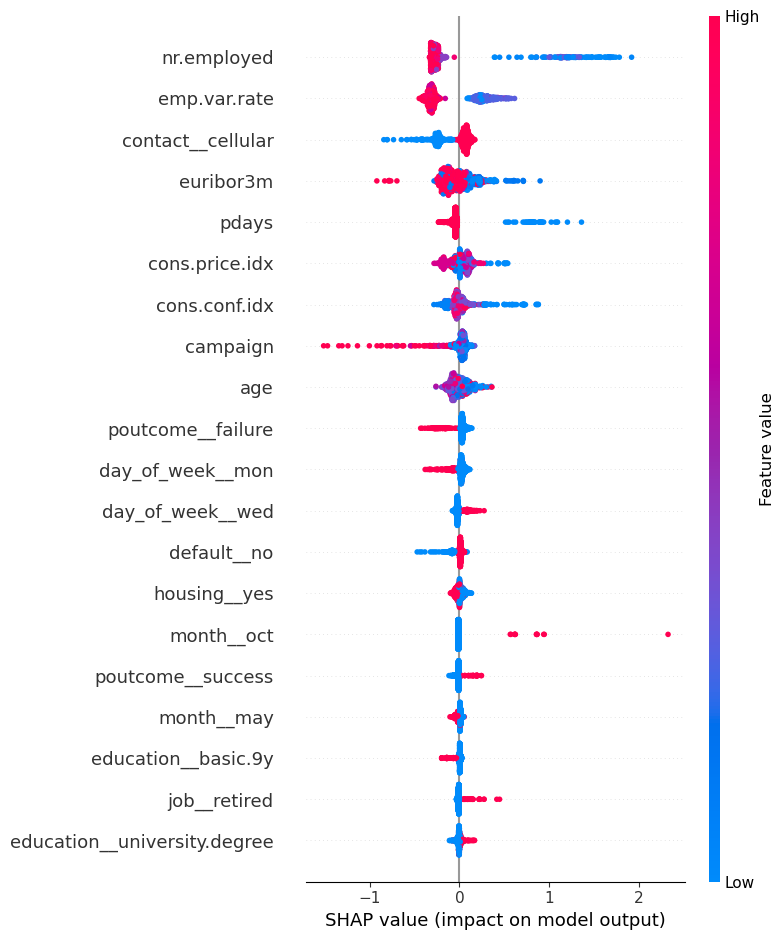

In [71]:
shap.summary_plot(shap_values, features=observations, feature_names=all_features)

That's better than the built-in feature importance on RandomForest because not only we can see what features are important but also how they affect our predictions.

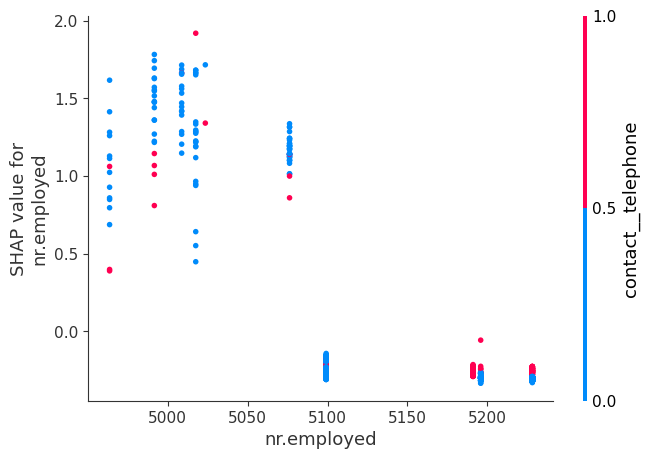

In [72]:
shap.dependence_plot("nr.employed", shap_values, 
                     pd.DataFrame(observations, columns=all_features))

# Intepreting models with non tabular data

The tools we have seen above also work with text data and images. There are plenty of examples available online for text-data. Here we will just demonstrate how to use `Lime` to explain an image classifier.

## Interpreting image classifiers

Lime can also be used to explain decisions made for image classification. 

In this example we will use the pretrained `InceptionV3` model available with Keras. Lime is quite slow with images, so it's wiser to stick to a "shallow" deep learning model.

In [73]:
from keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions
from keras.preprocessing.image import load_img#, img_to_array
from keras.utils import img_to_array
from keras.utils import normalize

Let's create a new instance of InceptionV3

In [74]:
model = InceptionV3()

2024-06-21 16:02:19.981059: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-21 16:02:19.982063: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Now we'll load a picture of a toucan, we need to make sure we load it at the good size for inception, here 229*229

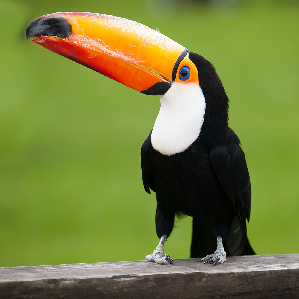

In [75]:
image_raw = load_img("data/toucan.jpg", target_size=(299, 299))
image_raw

We need to process the image to get a numpy array compatible with our model. Here we simply loads it to an array, reshape it and use the preprocess_input method provided by Keras that ensures all the preprocessing steps are made for us.

In [80]:
# Convert to numpy array, reshape and preprocess
# image = img_to_array(image_raw, data_format=None, dtype=None)


image = img_to_array(image_raw, data_format=None, dtype=None)

image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))

image = preprocess_input(image)


Now that our image is ready, generate predictions by using `.predict` as usual.

In [81]:
predictions = model.predict(image)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 880ms/step


You can check what labels your predictions correspond to by calling the function `decode_predictions` on your predictions. By default it returns the 5 more likely predictions

In [82]:
decode_predictions(predictions)

35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 1us/step


[[('n01843383', 'toucan', 0.94415784),
  ('n04146614', 'school_bus', 0.0012097835),
  ('n01829413', 'hornbill', 0.0011551703),
  ('n02607072', 'anemone_fish', 0.00046232375),
  ('n01614925', 'bald_eagle', 0.0004073968)]]

Great, we predicted a toucan with a probability of 99%, that's promising!

Remember that LIME needs the indices of the class we are interested in. Execute the cell bellow to get the indices corresponding to the 5 most probably classes we predicted above. Those indices correspond to the classes used in the ImageNet dataset that was used to train our model.

In [83]:
model.predict(image).argsort()[0, -5:][::-1]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


array([ 96, 779,  93, 393,  22])

Here the toucan corresponds to index 96, the school bus to index 779, etc..

Let's get started. First import the `LimeImageExplainer` and instantiate a new explainer

In [84]:
from lime.lime_image import LimeImageExplainer

In [85]:
explainer = LimeImageExplainer()

The explainer is the same as before, we call `explain_instance` to generate a new explanation. We need to provide:
- our observation: here the first row of our numpy matrix (that has only one row since we only have one image)
- our predict function, we can simply use the one from our model here
- `top_labels` the number of classes to explain. Here our model generate probabilities for more than a 1000 classes (and we looked at the five first). We do not want LIME to generate local models to explain each of those classes. As lime is pretty slow with images, let's only ask for the explanation to our two main classes, toucan and school bus
- `num_samples`: the number of new datapoints to create to fit a linear model, let's set it to 1000

*WARNING*: that will be slow. 

In [86]:
explanation = explainer.explain_instance(image[0], model.predict, 
                                         top_labels=2, num_samples=100,
                                         random_seed=42)

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step


In [87]:
from skimage.segmentation import mark_boundaries
from matplotlib import pyplot as plt

First let's check the explanation for the predicted class `toucan`. That corresponds to label 96 in the ImageNet classes. We need to use the method `get_image_and_mask` on our explanation object with the following parameters:
- index of the class to explain. We'll start with the index of the main class predicted, that was 96
- positive_only: in order to show the part of the image that contribute positively to this class being selected
- num_features: number of superpixels to use. LIME breaks down our image into a set of superpixels, each containing several pixels. Those superpixels are equivalent to `features` in tabular data.
- hide_rest: to hide the rest of the image

That returns a new image and a mask as numpy arrays. You can then use `mark_boundaries` to show the image together with the mask.

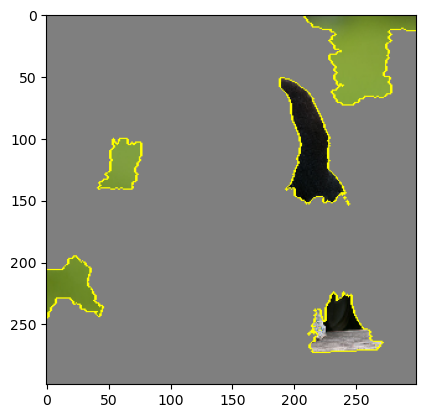

In [88]:
temp, mask = explanation.get_image_and_mask(96, positive_only=True, num_features=5, hide_rest=True)
# plot image and mask together
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

What feature do you expect to be the most important in that decision? Plot the image with only the main feature (`num_features=1`)

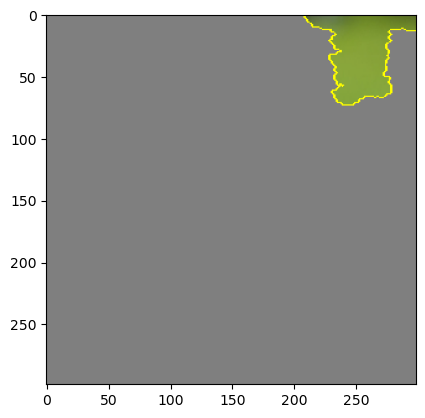

In [89]:
temp, mask = explanation.get_image_and_mask(96, positive_only=True, num_features=1, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

The second class predicted by our model was a bus (label 779), set `positive_only=False` in order to see what features contributed positively and negatively to that decision. What do you see?

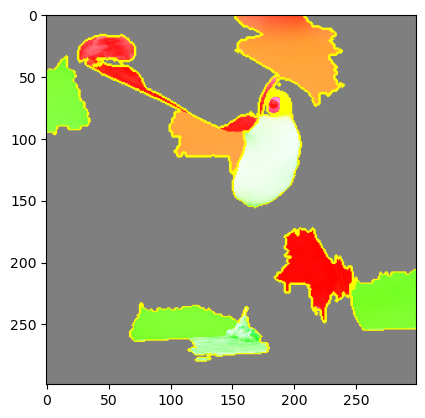

In [90]:
temp, mask = explanation.get_image_and_mask(779, positive_only=False, num_features=8, hide_rest=True)
plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))

Great, now you can try to change the number of features you're looking at and deactivate `positive_only` in order to see features that contribute negatively to the class. You can also look at other classes or try other pictures.